# ResNet

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision.datasets import Imagenette
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gs
import numpy as np
import os
import re

In [2]:
os.makedirs("models", exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 256
IMAGE_SIZE = 256
NUM_EPOCHS = 30

In [3]:
class RandomShortSideResize:

    def __init__(self, min_size=256, max_size=480):
        self.min = min_size
        self.max = max_size


    def __call__(self, img):
        size = torch.randint(self.min, self.max + 1, (1,)).item()
        return TF.resize(img, size)

In [4]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

ds = Imagenette(root=".", split="train", download=False, transform=transform)
loader = DataLoader(ds, batch_size=64, shuffle=False, num_workers=4)

mean = 0.
std = 0.
n = 0
for imgs, _ in loader:
    B, C, H, W = imgs.shape
    imgs = imgs.view(B, C, -1)
    mean += imgs.mean(2).sum(0)
    std += imgs.std(2).sum(0)
    n += B

mean /= n
std /= n

print("mean:", mean.tolist())
print("std:", std.tolist())

mean: [0.4655103385448456, 0.4546201229095459, 0.4250600039958954]
std: [0.23777231574058533, 0.2308262139558792, 0.2377445250749588]


In [5]:
normalize = transforms.Normalize(mean, std)


transform_train = transforms.Compose([
    RandomShortSideResize(256, 480),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    normalize,
])

transform_val = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize,
])


train_dataset = Imagenette(root=".", split='train', download=False, transform=transform_train)
test_dataset = Imagenette(root=".", split='val', download=False, transform=transform_val)


NUM_WORKERS = 8
PREFETCH    = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    prefetch_factor=PREFETCH,
    pin_memory=(device == "cuda"),
    drop_last=True,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    prefetch_factor=PREFETCH,
    pin_memory=(device == "cuda"),
    drop_last=False,
)

In [6]:
class ResNet(nn.Module):
    
    def __init__(self, num_classes: int = 10):
        super().__init__()
        self.conv1   = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1     = nn.BatchNorm2d(64)
        self.relu1   = nn.ReLU()
        self.pool1   = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.conv2   = nn.Conv2d(64, 64,  kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2     = nn.BatchNorm2d(64)
        self.relu2   = nn.ReLU()
        self.conv3   = nn.Conv2d(64, 64,  kernel_size=3, stride=1, padding=1, bias=False)
        self.bn3     = nn.BatchNorm2d(64)
        self.relu3   = nn.ReLU()

        self.conv4   = nn.Conv2d(64, 64,  kernel_size=3, stride=1, padding=1, bias=False)
        self.bn4     = nn.BatchNorm2d(64)
        self.relu4   = nn.ReLU()
        self.conv5   = nn.Conv2d(64, 64,  kernel_size=3, stride=1, padding=1, bias=False)
        self.bn5     = nn.BatchNorm2d(64)
        self.relu5   = nn.ReLU()

        self.conv6   = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn6     = nn.BatchNorm2d(128)
        self.relu6   = nn.ReLU()
        self.conv7   = nn.Conv2d(128,128, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn7     = nn.BatchNorm2d(128)
        self.relu7   = nn.ReLU()

        self.conv_proj1 = nn.Conv2d(64, 128, kernel_size=1, stride=2, bias=False)
        self.bn_proj1   = nn.BatchNorm2d(128)

        self.conv8   = nn.Conv2d(128,128, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn8     = nn.BatchNorm2d(128)
        self.relu8   = nn.ReLU()
        self.conv9   = nn.Conv2d(128,128, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn9     = nn.BatchNorm2d(128)
        self.relu9   = nn.ReLU()

        self.conv10  = nn.Conv2d(128,256, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn10    = nn.BatchNorm2d(256)
        self.relu10  = nn.ReLU()
        self.conv11  = nn.Conv2d(256,256, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn11    = nn.BatchNorm2d(256)
        self.relu11  = nn.ReLU()
        self.conv_proj2 = nn.Conv2d(128,256, kernel_size=1, stride=2, bias=False)
        self.bn_proj2   = nn.BatchNorm2d(256)

        self.conv12  = nn.Conv2d(256,256, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn12    = nn.BatchNorm2d(256)
        self.relu12  = nn.ReLU()
        self.conv13  = nn.Conv2d(256,256, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn13    = nn.BatchNorm2d(256)
        self.relu13  = nn.ReLU()

        self.conv14  = nn.Conv2d(256,512, kernel_size=3, stride=2, padding=1, bias=False)
        self.bn14    = nn.BatchNorm2d(512)
        self.relu14  = nn.ReLU()
        self.conv15  = nn.Conv2d(512,512, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn15    = nn.BatchNorm2d(512)
        self.relu15  = nn.ReLU()
        self.conv_proj3 = nn.Conv2d(256,512, kernel_size=1, stride=2, bias=False)
        self.bn_proj3   = nn.BatchNorm2d(512)

        self.conv16  = nn.Conv2d(512,512, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn16    = nn.BatchNorm2d(512)
        self.relu16  = nn.ReLU()
        self.conv17  = nn.Conv2d(512,512, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn17    = nn.BatchNorm2d(512)
        self.relu17  = nn.ReLU()

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc      = nn.Linear(512, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1.0)
                nn.init.constant_(m.bias, 0.0)


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.pool1(x)

        res_1 = x
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = x + res_1
        x = self.relu3(x)

        res_2 = x
        x = self.conv4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        x = self.conv5(x)
        x = self.bn5(x)
        x = x + res_2
        x = self.relu5(x)

        res_3 = self.bn_proj1(self.conv_proj1(x))
        x = self.conv6(x)
        x = self.bn6(x)
        x = self.relu6(x)
        x = self.conv7(x)
        x = self.bn7(x)
        x = x + res_3
        x = self.relu7(x)

        res_4 = x
        x = self.conv8(x)
        x = self.bn8(x)
        x = self.relu8(x)
        x = self.conv9(x)
        x = self.bn9(x)
        x = x + res_4
        x = self.relu9(x)

        res_5 = self.bn_proj2(self.conv_proj2(x))
        x = self.conv10(x)
        x = self.bn10(x)
        x = self.relu10(x)
        x = self.conv11(x)
        x = self.bn11(x)
        x = x + res_5
        x = self.relu11(x)

        res_6 = x
        x = self.conv12(x)
        x = self.bn12(x)
        x = self.relu12(x)
        x = self.conv13(x)
        x = self.bn13(x)
        x = x + res_6
        x = self.relu13(x)

        res_7 = self.bn_proj3(self.conv_proj3(x))
        x = self.conv14(x)
        x = self.bn14(x)
        x = self.relu14(x)
        x = self.conv15(x)
        x = self.bn15(x)
        x = x + res_7
        x = self.relu15(x)

        res_8 = x
        x = self.conv16(x)
        x = self.bn16(x)
        x = self.relu16(x)
        x = self.conv17(x)
        x = self.bn17(x)
        x = x + res_8
        x = self.relu17(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x

In [7]:
def evaluate(model: nn.Module, loader: DataLoader, device: str, loss_fn: nn.Module) -> tuple[float, float, float]:
    model.eval()
    total_loss = 0.0
    total = 0
    top1_correct = 0
    top5_correct = 0

    with torch.no_grad():
        val_bar = tqdm(loader, desc="[Eval]", leave=False)
        for imgs, labels in val_bar:
            imgs = imgs.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            outputs = model(imgs)
            loss = loss_fn(outputs, labels)
            total_loss += loss.item()

            maxk = min(5, outputs.size(1))
            _, pred = outputs.topk(maxk, dim=1, largest=True, sorted=True)
            pred = pred.t()
            correct = pred.eq(labels.view(1, -1).expand_as(pred))

            top1_correct += correct[:1].sum().item()
            top5_correct += correct[:maxk].sum().item()
            total += labels.size(0)

    avg_loss = total_loss / len(loader)
    top1_acc = 100.0 * top1_correct / total
    top5_acc = 100.0 * top5_correct / total
    return avg_loss, top1_acc, top5_acc

In [ ]:
model = ResNet()
model.to(device)

# decay, no_decay = [], []
# for n, p in model.named_parameters():
#     if not p.requires_grad:
#         continue

#     if n.endswith(".weight") and ("bn" not in n):
#         decay.append(p)
#     else:
#         no_decay.append(p)

# base_lr = 0.1 * (BATCH_SIZE / 256.0)

# optimizer = torch.optim.SGD(
#     [
#         {"params": decay, "weight_decay": 1e-4},
#         {"params": no_decay, "weight_decay": 0.0},
#     ],
#     lr=base_lr,
#     momentum=0.9,
#     nesterov=False,
# )

optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode="max", factor=0.1, patience=2,
)
loss_fn = nn.CrossEntropyLoss()

In [9]:
for epoch in range(NUM_EPOCHS):
    model.train()
    train_loss = 0.0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]", leave=False)
    for imgs, labels in train_bar:
        imgs = imgs.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        outputs = model(imgs)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    
    avg_val_loss, top1_acc, top5_acc = evaluate(model, test_loader, device, loss_fn)

    scheduler.step(top1_acc)

    print(f"Epoch {epoch+1} - Train loss: {avg_train_loss:.4f} | "
          f"Val loss: {avg_val_loss:.4f} | Top-1 val acc: {top1_acc:.2f}% | Top-5 val acc: {top5_acc:.2f}%" )

    if (epoch + 1) % 10 == 0:
        torch.save({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "train_loss": avg_train_loss,
            "val_loss": avg_val_loss,
            "top1_val_acc": top1_acc,
            "top5_val_acc": top5_acc,
        }, os.path.join("models", "resnet_imagenette_checkpoint.pth"))


Epoch 1 - Train loss: 1.8726 | Val loss: 2.1452 | Top-1 val acc: 31.29% | Top-5 val acc: 82.19%


Epoch 2 - Train loss: 1.4586 | Val loss: 2.4207 | Top-1 val acc: 35.95% | Top-5 val acc: 86.04%


Epoch 3 - Train loss: 1.3222 | Val loss: 1.3970 | Top-1 val acc: 55.75% | Top-5 val acc: 92.46%


Epoch 4 - Train loss: 1.2160 | Val loss: 1.3253 | Top-1 val acc: 57.48% | Top-5 val acc: 92.76%


Epoch 5 - Train loss: 1.1451 | Val loss: 1.0878 | Top-1 val acc: 65.48% | Top-5 val acc: 95.26%


Epoch 6 - Train loss: 1.0931 | Val loss: 1.1824 | Top-1 val acc: 64.56% | Top-5 val acc: 94.37%


Epoch 7 - Train loss: 1.0256 | Val loss: 1.2106 | Top-1 val acc: 60.33% | Top-5 val acc: 93.83%


Epoch 8 - Train loss: 0.9814 | Val loss: 0.9346 | Top-1 val acc: 70.85% | Top-5 val acc: 96.46%


Epoch 9 - Train loss: 0.9533 | Val loss: 1.2094 | Top-1 val acc: 64.03% | Top-5 val acc: 94.90%


Epoch 10 - Train loss: 0.9183 | Val loss: 1.1387 | Top-1 val acc: 65.17% | Top-5 val acc: 94.47%


Epoch 11 - Train loss: 0.8751 | Val loss: 0.9437 | Top-1 val acc: 69.10% | Top-5 val acc: 96.03%


Epoch 12 - Train loss: 0.7759 | Val loss: 0.6189 | Top-1 val acc: 80.23% | Top-5 val acc: 98.24%


Epoch 13 - Train loss: 0.7004 | Val loss: 0.6090 | Top-1 val acc: 80.54% | Top-5 val acc: 98.24%


Epoch 14 - Train loss: 0.6779 | Val loss: 0.5888 | Top-1 val acc: 81.10% | Top-5 val acc: 98.29%


Epoch 15 - Train loss: 0.6500 | Val loss: 0.5796 | Top-1 val acc: 81.63% | Top-5 val acc: 98.32%


Epoch 16 - Train loss: 0.6609 | Val loss: 0.6059 | Top-1 val acc: 80.46% | Top-5 val acc: 98.14%


Epoch 17 - Train loss: 0.6374 | Val loss: 0.5762 | Top-1 val acc: 81.73% | Top-5 val acc: 98.29%


Epoch 18 - Train loss: 0.6205 | Val loss: 0.5928 | Top-1 val acc: 81.10% | Top-5 val acc: 98.24%


Epoch 19 - Train loss: 0.6255 | Val loss: 0.5827 | Top-1 val acc: 81.55% | Top-5 val acc: 98.34%


Epoch 20 - Train loss: 0.6163 | Val loss: 0.5648 | Top-1 val acc: 82.37% | Top-5 val acc: 98.22%


Epoch 21 - Train loss: 0.6136 | Val loss: 0.5909 | Top-1 val acc: 81.04% | Top-5 val acc: 98.24%


Epoch 22 - Train loss: 0.6063 | Val loss: 0.5512 | Top-1 val acc: 82.37% | Top-5 val acc: 98.50%


Epoch 23 - Train loss: 0.5819 | Val loss: 0.5980 | Top-1 val acc: 80.79% | Top-5 val acc: 98.19%


Epoch 24 - Train loss: 0.5624 | Val loss: 0.5238 | Top-1 val acc: 83.46% | Top-5 val acc: 98.57%


Epoch 25 - Train loss: 0.5645 | Val loss: 0.5161 | Top-1 val acc: 83.85% | Top-5 val acc: 98.57%


Epoch 26 - Train loss: 0.5651 | Val loss: 0.5213 | Top-1 val acc: 83.67% | Top-5 val acc: 98.57%


Epoch 27 - Train loss: 0.5523 | Val loss: 0.5184 | Top-1 val acc: 83.75% | Top-5 val acc: 98.60%


Epoch 28 - Train loss: 0.5507 | Val loss: 0.5148 | Top-1 val acc: 83.77% | Top-5 val acc: 98.55%


Epoch 29 - Train loss: 0.5600 | Val loss: 0.5152 | Top-1 val acc: 83.82% | Top-5 val acc: 98.57%


Epoch 30 - Train loss: 0.5542 | Val loss: 0.5175 | Top-1 val acc: 83.75% | Top-5 val acc: 98.60%


# Visualising ResNet

In [7]:
checkpoint = torch.load("models/resnet_imagenette_checkpoint.pth", map_location="cpu")
model = ResNet().to(device)
model.load_state_dict(checkpoint["model_state_dict"], strict=False)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU()
  (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU()
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU()
  (conv5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn5): BatchNorm2d(64, eps=1e-05

In [8]:
class GuidedBackprop:
    
    def __init__(self, model: nn.Module):
        self.model = model
        self._handles = []
        def fwd_relu(m: nn.Module, inp: tuple[torch.Tensor, ...], out: torch.Tensor) -> None: 
            m._gbp_out = out

        def bwd_relu(m: nn.Module, gin: tuple[torch.Tensor, ...], gout: tuple[torch.Tensor, ...]) -> tuple[torch.Tensor,]:
            mask = (m._gbp_out > 0).type_as(gout[0])
            return (torch.clamp(gout[0], min=0.0) * mask, )

        for m in self.model.modules():
            if isinstance(m, nn.ReLU):
                self._handles.append(m.register_forward_hook(fwd_relu))
                self._handles.append(m.register_full_backward_hook(bwd_relu))

    def close(self) -> None:
        for h in self._handles: h.remove()
        self._handles.clear()


def compute_rf(model: nn.Module, in_hw: tuple[int, int] = (224,224),
               layers: tuple[str, ...] = None) -> dict[str, tuple[int, int, float]]:
    """
    Return per-layer (rf_size, jump, start) in input pixel coords.
    start is the center (in pixel coords) of the [0,0] activation.
    """
    r, j, s = 1.0, 1.0, 0.5
    table = {}
    for name in layers:
        m = getattr(model, name)
        if isinstance(m, nn.Conv2d):
            k = float(m.kernel_size[0]); p = float(m.padding[0]); st = float(m.stride[0])
            r = r + (k - 1.0) * j
            s = s + ((k - 1.0) / 2.0 - p) * j
            j = j * st
        elif isinstance(m, nn.MaxPool2d):
            k = float(m.kernel_size if isinstance(m.kernel_size, int) else m.kernel_size[0])
            p = float(m.padding if isinstance(m.padding, int) else m.padding[0])
            st = float(m.stride if isinstance(m.stride, int) else m.stride[0])
            r = r + (k - 1.0) * j
            s = s + ((k - 1.0) / 2.0 - p) * j
            j = j * st
        table[name] = (int(round(r)), int(round(j)), float(s))

    return table

In [17]:
def _as_3x1x1(v):
    if v is None: 
        return None

    v = torch.tensor(v) if not isinstance(v, torch.Tensor) else v
    return v.float().view(3,1,1)


class Visualiser:
    """
    Guided ReLU visualisation with top-k activations per feature map,
    receptive-field matched patches.
    """

    TAP = {
        "conv1": "relu1",   "conv2": "relu2",
        "conv3": "relu3",   "conv4": "relu4",
        "conv5": "relu5",   "conv6": "relu6",   "conv7": "relu7",
        "conv8": "relu8",   "conv9": "relu9",   "conv10": "relu10",
        "conv11": "relu11", "conv12": "relu12", "conv13": "relu13",
        "conv14": "relu14", "conv15": "relu15", "conv16": "relu16",
        "conv17": "relu17",
        "pool1": "pool1",
    }

    _RF_ORDER = [
        "conv1","pool1",
        "conv2","conv3",
        "conv4","conv5",
        "conv6","conv7",
        "conv8","conv9",
        "conv10","conv11",
        "conv12","conv13",
        "conv14","conv15",
        "conv16","conv17",
    ]

    def __init__(self, model: nn.Module, device: str = device, mean: float = None, std: float = None):
        self.m = model.eval().to(device)
        self.device = device
        self.mean = _as_3x1x1(mean)
        self.std = _as_3x1x1(std)
        self.handles = []
        self.acts = {}
        self._keep_graph = False

        for name in self._RF_ORDER:
            self._register_activation(name)

        self.rf_tbl = compute_rf(self.m, in_hw=(224, 224), layers=self._RF_ORDER)


    def _register_activation(self, name: str) -> None:
        tap_name = self.TAP[name]
        mod = getattr(self.m, tap_name)
        def hook(_, __, out):
            self.acts[name] = out if self._keep_graph else out.detach()
        self.handles.append(mod.register_forward_hook(hook))


    @torch.no_grad()
    def _rank_channels_by_activity(self, loader: DataLoader, layer: str) -> list[int]:
        totals = None
        for imgs, _ in loader:
            imgs = imgs.to(self.device, non_blocking=True)
            _ = self._forward(imgs)
            A = self.acts[layer]
            m = A.mean(dim=(0,2,3))
            totals = m if totals is None else totals + m
        return torch.argsort(totals, descending=True).tolist()


    def close(self) -> None:
        for h in self.handles: h.remove()
        self.handles.clear()


    @torch.no_grad()
    def _forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.m(x)


    def _forward_with_grad(self, x: torch.Tensor) -> torch.Tensor:
        self._keep_graph = True
        out = self.m(x)
        self._keep_graph = False
        return out


    def _guided_from_unit(self, layer: str, fmap: int, y: int, x: int, img1x: torch.Tensor) -> torch.Tensor:
        gbp = GuidedBackprop(self.m)
        _ = self._forward_with_grad(img1x)
        scalar = self.acts[layer][0, fmap, y, x]
        self.m.zero_grad(set_to_none=True)
        scalar.backward(retain_graph=False)
        grad = img1x.grad.detach()[0]
        gbp.close()
        g = grad - grad.min()
        g = (g / (g.max() + 1e-8)).clamp(0,1)
        return g


    @staticmethod
    def _rf_box(rf: int, jump: int, start: float, y: int, x: int) -> tuple[int, int, int, int]:
        cy = int(round(start + y * jump))
        cx = int(round(start + x * jump))
        half = rf // 2
        y0, y1 = cy - half, cy + half + 1
        x0, x1 = cx - half, cx + half + 1
        return y0, y1, x0, x1


    @staticmethod
    def _rf_fully_inside(H: int, W: int, rf: int, jump: int, start: float, y: int, x: int) -> bool:
        y0, y1, x0, x1 = Visualiser._rf_box(rf, jump, start, y, x)
        return (y0 >= 0) and (x0 >= 0) and (y1 <= H) and (x1 <= W)


    @torch.inference_mode()
    def topk_for_featuremap(self, loader: DataLoader, layer: str, fmap: int, k: int = 9,
                            inside_only: bool = False, oversample_factor: int = 5):
        top = []
        rf, jump, start = self.rf_tbl[layer]
        for imgs, labels in loader:
            imgs = imgs.to(self.device, non_blocking=True)
            _ = self._forward(imgs)
            A = self.acts[layer]
            Hf, Wf = A.shape[-2:]
            Himg, Wimg = imgs.shape[-2:]
            n_cand = min(Hf * Wf, max(k, 1) * max(oversample_factor, 1))
            vals, idxs = A[:, fmap].view(imgs.size(0), -1).topk(n_cand, dim=1)
            for b in range(imgs.size(0)):
                for j in range(vals.shape[1]):
                    score = float(vals[b, j])
                    if score <= 0: continue
                    flat = int(idxs[b, j])
                    y, x = divmod(flat, Wf)
                    if inside_only and not self._rf_fully_inside(Himg, Wimg, rf, jump, start, y, x):
                        continue
                    top.append((score, (imgs[b].detach().cpu(), int(labels[b]), len(top)), (y, x)))
                    
        top = sorted(top, key=lambda t: t[0], reverse=True)[:k]
        return top


    @staticmethod
    def _crop_patch(img3hw: torch.Tensor, center_yx: tuple[int,int], rf_size: int, jump: int, start: float) -> torch.Tensor:
        H, W = img3hw.shape[-2], img3hw.shape[-1]
        y, x = center_yx
        cy = int(round(start + y * jump))
        cx = int(round(start + x * jump))
        half = rf_size // 2
        y0_des, y1_des = cy - half, cy + half + 1
        x0_des, x1_des = cx - half, cx + half + 1
        y0, y1 = max(0, y0_des), min(H, y1_des)
        x0, x1 = max(0, x0_des), min(W, x1_des)
        patch = img3hw[:, y0:y1, x0:x1]
        pad_top    = max(0, -y0_des)
        pad_bottom = max(0,  y1_des - H)
        pad_left   = max(0, -x0_des)
        pad_right  = max(0,  x1_des - W)
        if pad_left or pad_right or pad_top or pad_bottom:
            patch = F.pad(patch, (pad_left, pad_right, pad_top, pad_bottom))
        if patch.shape[-2:] != (rf_size, rf_size):
            patch = F.pad(
                patch,
                (0, max(0, rf_size - patch.shape[-1]),
                 0, max(0, rf_size - patch.shape[-2]))
            )[:, :rf_size, :rf_size]
        return patch


    def _denorm(self, patch: torch.Tensor) -> torch.Tensor:
        """Invert transforms.Normalize for display only."""
        if (self.mean is not None) and (self.std is not None):
            return (patch * self.std + self.mean).clamp(0, 1)

        return patch.clamp(0,1)


    def figure2_panel(
        self, 
        loader: DataLoader, 
        layers: tuple[str, ...] = ("conv1","conv2","conv3",
        "conv4","conv5","conv6","conv7","conv8","conv9",
        "conv10","conv11","conv12","conv13","conv14","conv15",
        "conv16","conv17"), 
        k_per_map: int = 9, 
        n_maps: int = 4, 
        seed: int = 0
    ) -> dict[str, list[tuple[torch.Tensor, torch.Tensor]]]:

        if isinstance(layers, str):
            layers = (layers,)

        rng = np.random.default_rng(seed)
        self.m.eval()
        panels = {}

        for layer in layers:
            C = getattr(self.m, layer).out_channels if layer.startswith("conv") else self.acts[layer].shape[1]
            ranked = self._rank_channels_by_activity(loader, layer)
            chosen = np.array(ranked[:min(n_maps, C)])
            rows = []
            rf, jump, start = self.rf_tbl[layer]
            guided_rows = {}

            for fmap in chosen:
                items = self.topk_for_featuremap(loader, layer, fmap, k=k_per_map, inside_only=True, oversample_factor=5)
                guided_imgs, patch_imgs = [], []
                for score, (img, lbl, _), (y, x) in items:
                    x_full = img.to(self.device, non_blocking=True).clone().unsqueeze(0)
                    patch_raw = self._crop_patch(img.cpu(), (y, x), rf, jump, start)
                    img1x = x_full.clone().requires_grad_(True)
                    gmap = self._guided_from_unit(layer, fmap, y, x, img1x).cpu()
                    gpatch = self._crop_patch(gmap, (y, x), rf, jump, start).clamp(0,1)

                    patch_disp = self._denorm(patch_raw)

                    guided_imgs.append(gpatch)
                    patch_imgs.append(patch_disp)

                if guided_imgs and patch_imgs:
                    rows.append((torch.stack(guided_imgs), torch.stack(patch_imgs)))

            panels[layer] = rows

        return panels


    @staticmethod
    def show_panels(panels: dict[str, list[tuple[torch.Tensor, torch.Tensor]]], title: str = "") -> None:
        for layer, rows in panels.items():
            if not rows:
                continue
            k = rows[0][0].shape[0]
            m = re.search(r"(\d+)", layer)
            layer_label = f"Layer {m.group(1)} ({layer})" if m else layer

            R = len(rows)
            fig = plt.figure(figsize=(2.0 * k * 2, 2.0 * R))
            grid = gs.GridSpec(R, 2, figure=fig, wspace=0.05, hspace=0.05)

            for r, (recs, patches) in enumerate(rows):
                axL = fig.add_subplot(grid[r, 0])
                grid_r = make_grid(recs, nrow=min(k, 9), padding=2)
                axL.imshow(np.transpose(grid_r.numpy(), (1, 2, 0)))
                axL.axis("off")

                axR = fig.add_subplot(grid[r, 1])
                grid_p = make_grid(patches, nrow=min(k, 9), padding=2)
                axR.imshow(np.transpose(grid_p.numpy(), (1, 2, 0)))
                axR.axis("off")

            fig.suptitle(f"{layer_label}", x=0.51, y=0.95, fontsize=22)
            fig.text(0.31, 0.89, "Guided ReLU Recons", ha="center", va="bottom", fontsize=20)
            fig.text(0.71, 0.89, "Image patches", ha="center", va="bottom", fontsize=20)

            plt.show()

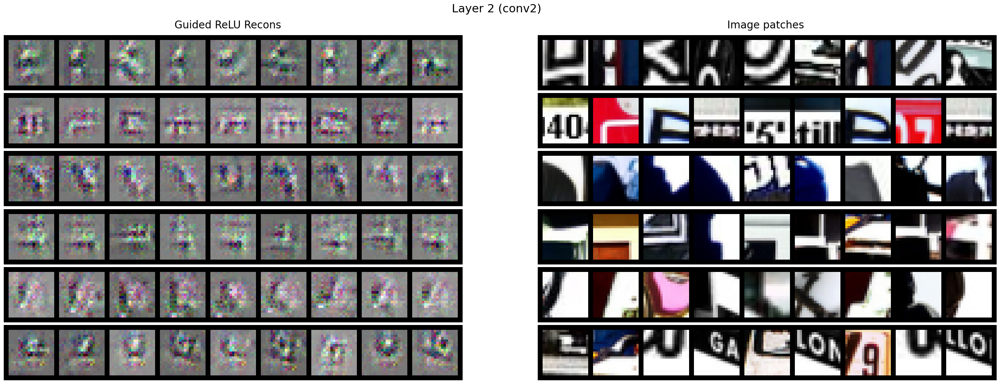

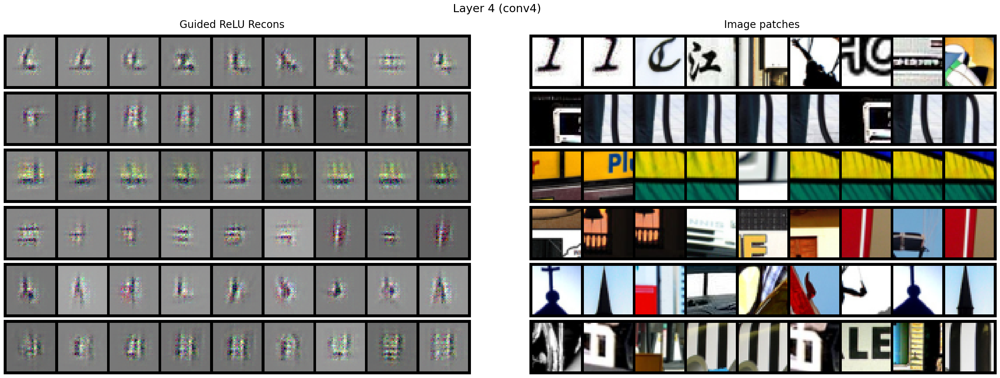

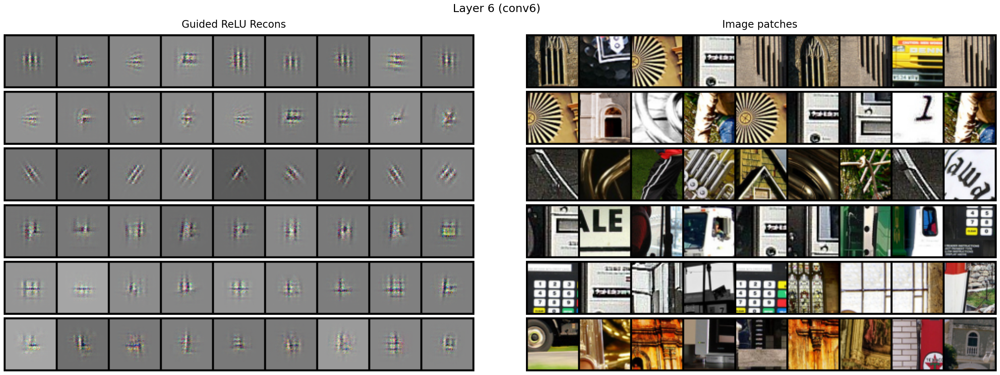

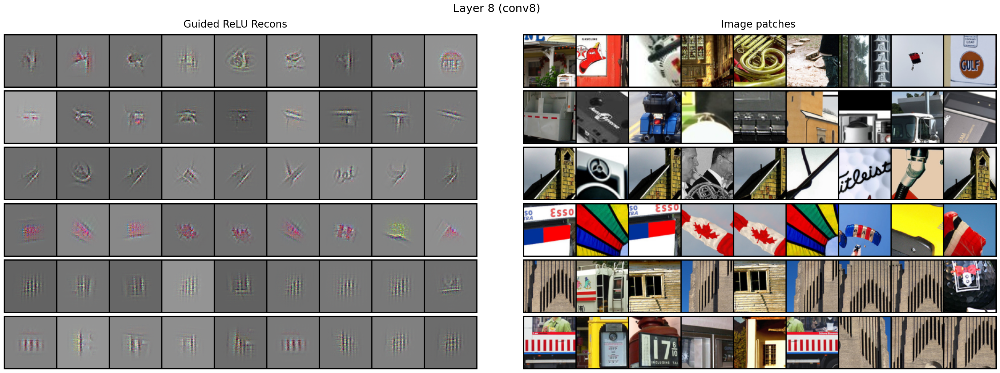

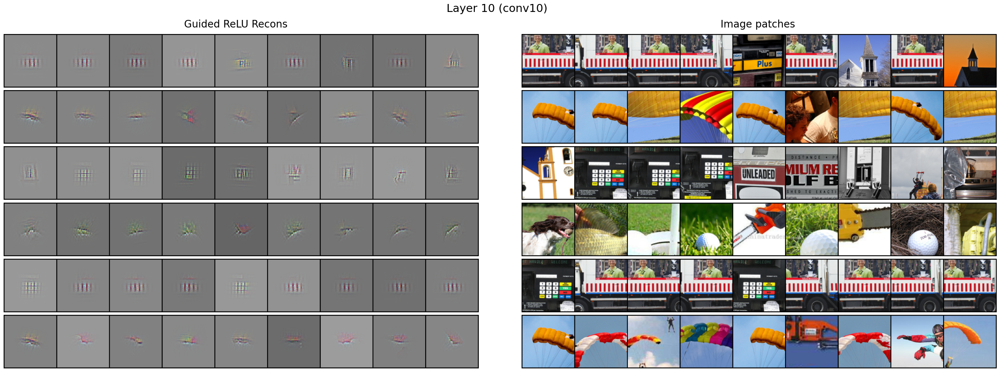

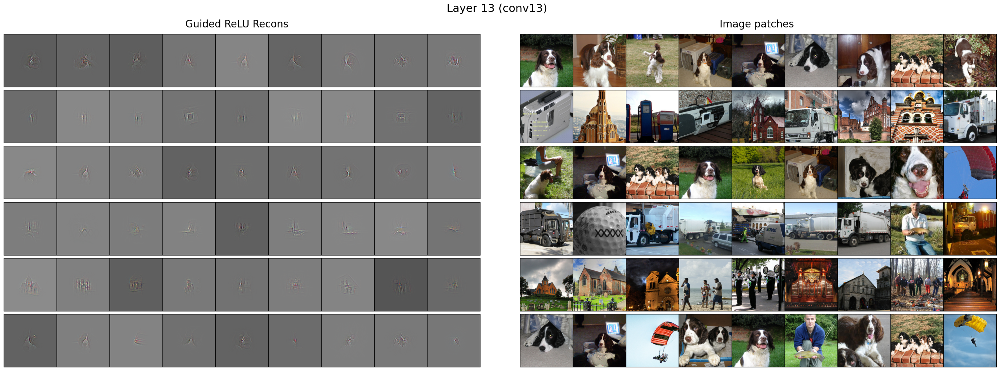

In [20]:
vis = Visualiser(model, device=device, mean=mean, std=std)

panels = vis.figure2_panel(
    test_loader,
    layers=("conv2", "conv4", "conv6", "conv8", "conv10", "conv13"),
    k_per_map=9,
    n_maps=6,
    seed=0,
)
vis.show_panels(panels)
vis.close()